<a href="https://colab.research.google.com/github/gokulgokul4029677-ship-i/AIML/blob/main/ML_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [18]:
from google.colab import files
files.upload()




Saving Dataset .csv to Dataset  (1).csv


{'Dataset  (1).csv': b'\xef\xbb\xbfRestaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes\n6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenue, Poblacion, Makati City","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Makati City",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314\n6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Makati City",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591\n6300002,Heat - Edsa Shangri-La,162,Mandaluy

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster


In [31]:
df = pd.read_csv('Dataset .csv')
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [21]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [22]:
df = df.dropna(subset=['Latitude', 'Longitude'])


In [23]:
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=5)

marker_cluster = MarkerCluster().add_to(restaurant_map)

for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['City']
    ).add_to(marker_cluster)

restaurant_map


In [24]:
city_counts = df['City'].value_counts().head(10)
city_counts


,count
City,
New Delhi,5473
Gurgaon,1118
Noida,1080
Faridabad,251
Ghaziabad,25
Bhubaneshwar,21
Lucknow,21
Ahmedabad,21
Amritsar,21


/tmp/ipython-input-1001739492.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=city_counts.values, y=city_counts.index, palette="viridis")


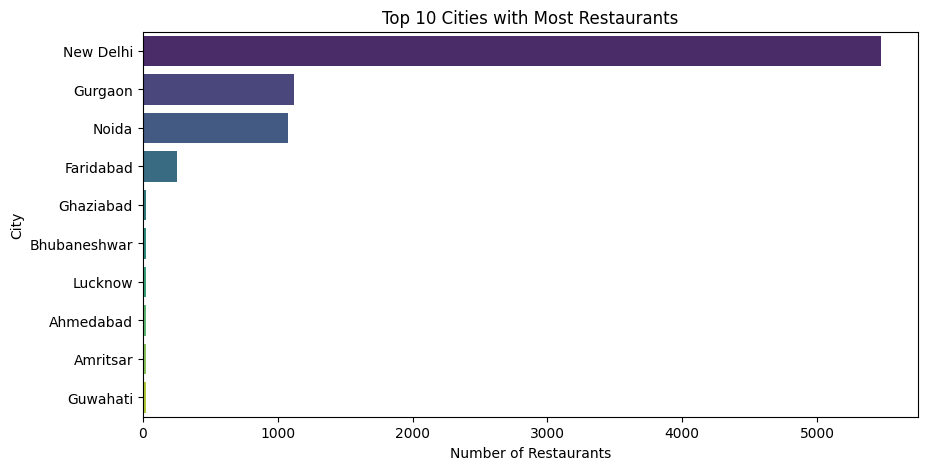

In [25]:
plt.figure(figsize=(10,5))
sns.barplot(x=city_counts.values, y=city_counts.index, palette="viridis")
plt.title("Top 10 Cities with Most Restaurants")
plt.xlabel("Number of Restaurants")
plt.ylabel("City")
plt.show()


In [26]:
locality_counts = df['Locality'].value_counts().head(10)
locality_counts


,count
Locality,
Connaught Place,122
Rajouri Garden,99
Shahdara,87
Defence Colony,86
Malviya Nagar,85
Pitampura,85
Mayur Vihar Phase 1,84
Rajinder Nagar,81
Safdarjung,80


In [27]:
avg_cost_city = df.groupby('City')['Average Cost for two'].mean().sort_values(ascending=False)
avg_cost_city.head(10)


,Average Cost for two
City,
Jakarta,308437.500000
Tangerang,250000.000000
Bogor,160000.000000
Bandung,150000.000000
Pasay City,3333.333333
Colombo,2375.000000
Mandaluyong City,2000.000000
Panchkula,2000.000000
Taguig City,1725.000000


In [28]:
df['Cuisines'] = df['Cuisines'].astype(str)

cuisine_city = df.groupby('City')['Cuisines'].apply(
    lambda x: x.value_counts().index[0]
)

cuisine_city.head(10)


,Cuisines
City,
Abu Dhabi,American
Agra,"North Indian, Mughlai"
Ahmedabad,"Chinese, Italian, North Indian, Mexican, Medit..."
Albany,nan
Allahabad,"North Indian, Chinese"
Amritsar,North Indian
Ankara,"Kebab, Turkish Pizza"
Armidale,"Bar Food, Steak"
Athens,"American, Italian, Pizza"


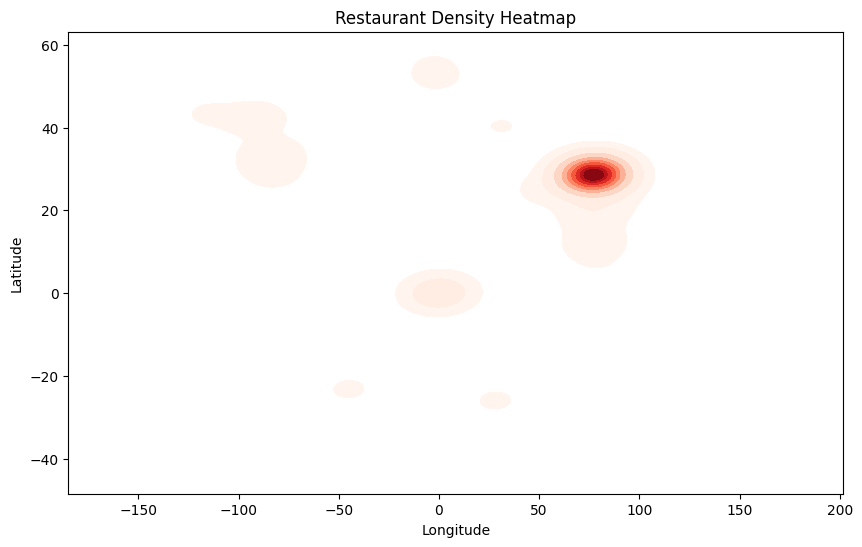

In [29]:
plt.figure(figsize=(10,6))
sns.kdeplot(
    x=df['Longitude'],
    y=df['Latitude'],
    cmap="Reds",
    fill=True
)
plt.title("Restaurant Density Heatmap")
plt.show()


In [42]:
print("Key Insights:")
print("- Restaurants are highly concentrated in major cities.")
print("- Certain cities have higher average ratings.")
print("- Price ranges vary significantly by city.")
print("- Popular cuisines differ across locations.")


Key Insights:
- Restaurants are highly concentrated in major cities.
- Certain cities have higher average ratings.
- Price ranges vary significantly by city.
- Popular cuisines differ across locations.


In [34]:
data = {
    "Restaurant Name": [
        "Spice Hub", "Urban Bites", "Food Fiesta", "Royal Dine", "Taste Town",
        "Cafe Delight", "Burger Point", "Sushi Zen", "Pasta Palace", "Curry House"
    ],
    "City": [
        "Delhi", "Delhi", "Mumbai", "Mumbai", "Bangalore",
        "Bangalore", "Chennai", "Chennai", "Hyderabad", "Hyderabad"
    ],
    "Locality": [
        "Connaught Place", "Karol Bagh", "Andheri", "Bandra", "Indiranagar",
        "Whitefield", "T Nagar", "Velachery", "Banjara Hills", "Gachibowli"
    ],
    "Latitude": [
        28.6315, 28.6519, 19.1197, 19.0596, 12.9716,
        12.9698, 13.0418, 12.9756, 17.4123, 17.4401
    ],
    "Longitude": [
        77.2167, 77.1907, 72.8468, 72.8295, 77.5946,
        77.7499, 80.2341, 80.2212, 78.4483, 78.3489
    ],
    "Aggregate rating": [
        4.2, 3.8, 4.5, 4.0, 4.3,
        4.1, 3.9, 4.4, 4.6, 4.0
    ],
    "Cuisines": [
        "North Indian", "Chinese", "Italian", "North Indian", "South Indian",
        "Cafe", "Fast Food", "Japanese", "Italian", "North Indian"
    ],
    "Average Cost for two": [
        1200, 800, 1500, 1400, 900,
        700, 600, 1600, 1300, 1100
    ]
}

df = pd.DataFrame(data)
df


,Restaurant Name,City,Locality,Latitude,Longitude,Aggregate rating,Cuisines,Average Cost for two
0,Spice Hub,Delhi,Connaught Place,28.6315,77.2167,4.2,North Indian,1200
1,Urban Bites,Delhi,Karol Bagh,28.6519,77.1907,3.8,Chinese,800
2,Food Fiesta,Mumbai,Andheri,19.1197,72.8468,4.5,Italian,1500
3,Royal Dine,Mumbai,Bandra,19.0596,72.8295,4.0,North Indian,1400
4,Taste Town,Bangalore,Indiranagar,12.9716,77.5946,4.3,South Indian,900
5,Cafe Delight,Bangalore,Whitefield,12.9698,77.7499,4.1,Cafe,700
6,Burger Point,Chennai,T Nagar,13.0418,80.2341,3.9,Fast Food,600
7,Sushi Zen,Chennai,Velachery,12.9756,80.2212,4.4,Japanese,1600
8,Pasta Palace,Hyderabad,Banjara Hills,17.4123,78.4483,4.6,Italian,1300
9,Curry House,Hyderabad,Gachibowli,17.4401,78.3489,4.0,North Indian,1100


In [35]:
df.to_csv("restaurant_data.csv", index=False)
print("Dataset saved as restaurant_data.csv")


Dataset saved as restaurant_data.csv


In [36]:
df = pd.read_csv("restaurant_data.csv")
df.head()


,Restaurant Name,City,Locality,Latitude,Longitude,Aggregate rating,Cuisines,Average Cost for two
0,Spice Hub,Delhi,Connaught Place,28.6315,77.2167,4.2,North Indian,1200
1,Urban Bites,Delhi,Karol Bagh,28.6519,77.1907,3.8,Chinese,800
2,Food Fiesta,Mumbai,Andheri,19.1197,72.8468,4.5,Italian,1500
3,Royal Dine,Mumbai,Bandra,19.0596,72.8295,4.0,North Indian,1400
4,Taste Town,Bangalore,Indiranagar,12.9716,77.5946,4.3,South Indian,900


In [37]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant Name       10 non-null     object 
 1   City                  10 non-null     object 
 2   Locality              10 non-null     object 
 3   Latitude              10 non-null     float64
 4   Longitude             10 non-null     float64
 5   Aggregate rating      10 non-null     float64
 6   Cuisines              10 non-null     object 
 7   Average Cost for two  10 non-null     int64  
dtypes: float64(3), int64(1), object(4)
memory usage: 772.0+ bytes


In [40]:
df.groupby('City')['Aggregate rating'].mean()


,Aggregate rating
City,
Bangalore,4.20
Chennai,4.15
Delhi,4.00
Hyderabad,4.30
Mumbai,4.25


In [39]:
df.groupby('City')['Average Cost for two'].mean()


,Average Cost for two
City,
Bangalore,800.0
Chennai,1100.0
Delhi,1000.0
Hyderabad,1200.0
Mumbai,1450.0


In [38]:
df.groupby('City')['Cuisines'].agg(lambda x: x.value_counts().index[0])


,Cuisines
City,
Bangalore,South Indian
Chennai,Fast Food
Delhi,North Indian
Hyderabad,Italian
Mumbai,Italian


In [41]:
import folium
from folium.plugins import MarkerCluster

m = folium.Map(
    location=[df['Latitude'].mean(), df['Longitude'].mean()],
    zoom_start=5
)

cluster = MarkerCluster().add_to(m)

for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']} - {row['City']}"
    ).add_to(cluster)

m
